In [1]:
import csv
import math
from datetime import datetime
import os
import matplotlib.pyplot as plt
import numpy as np
from typing import List, collections
import numpy.linalg as LA
import math
import cx_Oracle
import json
import sys
import configparser

In [2]:
plt.rc("font", family="Hiragino Sans GB W3")
plt.rc("font", family="Microsoft Yahei")
plt.rcParams['font.sans-serif'] = ['Microsoft Yahei']  # 用来正常显示中文标签
plt.rcParams['font.sans-serif'] = ['YaHei Consolas Hybrid']  # 用来正常显示中文标签
plt.rcParams['axes.unicode_minus'] = False  # 用来正常显示负号

# 1 数据获取

## 1.1 数据库连接

In [3]:
def get_connection(user, password, dsn):
    '''
    this function is used to connection to oracle and to get a cursor
    获取数据库连接

    ready to be restruct to with the config file module
    之后将其写成配置文件的形式
    '''
    connection = cx_Oracle.connect(user=user, password=password, 
    dsn=dsn, encoding="UTF-8")
    # cursor = connection.cursor()
    return connection
        

In [4]:
def close_connection(conn, cursor):
    '''
    关闭数据库连接
    '''
    cursor.close()
    conn.close()

In [5]:
start_time = 1642724618
end_time = 1653878313

## 1.2 查询指定时间范围内数据

In [6]:
def search_the_data(start_time, end_time, table):
    '''
    在数据库指定表中搜寻指定时间范围内的温度数据并返回

    :param start_time: 开始时间
    :param end_time: 结束时间
    :param table: 查询的目标表

    :return: 返回介于开始时间和结束时间内的数据
    :time_list: 时间戳列表
    :tmp_list: 温度列表
    '''
    legal_table_1 = ['0205196', '1307052', '1308065', '1310002']
    legal_table_2 = ['1302028']
    if table in legal_table_1:
        conn = get_connection("stephen", "990907", "localhost/orcl")
        cursor = conn.cursor()
        sql = f"select TO_CHAR(NOWTIME/(60*60*24)+TO_DATE('1970-01-01 08:00:00', 'YYYY-MM-DD HH:MI:SS'),'YYYY-MM-DD HH24:MI:SS') as NOWTIME,T1_CURRENT FROM HISTORY_{table} \
                WHERE NOWTIME BETWEEN {start_time} AND {end_time} order by NOWTIME"
        # 重写 sql 语句，并执行后解析数据，最后返回
        cursor.execute(sql)
        query_result = cursor.fetchall()
        time_list = [ row[0] for row in query_result]
        tmp_list = [ row[1] for row in query_result]
        close_connection(conn=conn, cursor=cursor)
        return time_list, tmp_list
    elif table in legal_table_2:
        conn = get_connection("stephen", "990907", "localhost/orcl")
        cursor = conn.cursor()
        sql = f"select TO_CHAR(NOW_TIME/(60*60*24)+TO_DATE('1970-01-01 08:00:00', 'YYYY-MM-DD HH:MI:SS'),'YYYY-MM-DD HH24:MI:SS') as NOW_TIME,CONTROLTEMP_CURRENT_T FROM \
                ( select * from HISTORY_{table} order by NOW_TIME) \
                WHERE NOW_TIME BETWEEN {start_time} AND {end_time} order by NOW_TIME"
        # 重写 sql 语句，并执行后解析数据，最后返回
        cursor.execute(sql)
        query_result = cursor.fetchall()
        time_list = [ row[0] for row in query_result]
        tmp_list = [ row[1] for row in query_result]
        close_connection(conn=conn, cursor=cursor)
        return time_list, tmp_list
    else:
        close_connection(conn=conn, cursor=cursor)
        return [],[]
    

In [7]:
time_list, tmp_list = search_the_data(start_time=start_time, end_time=end_time, table='1302028')

# 2 PLA 实现

## 2.1 选择转折点

In [8]:
def get_TurnPoint(data, angle_thred):
    ''' 
    :paras data:时间序列数据
    :paras angle_thred: 判定其是否为转折点的角度阈值

    :return turnPoints: 预选的转折点
    '''
    turnPoints = []
    for index in range(1, len(data)-1):
        # 这里存在一个隐性的 时间序列采样是否均匀 的问题
        theta1 = math.atan(data[index] - data[index - 1]) * (180 / math.pi)
        theta2 = math.atan(data[index + 1] - data[index]) * (180 / math.pi)
        if theta1 * theta2 < 0:
            alpha = abs(theta1) + abs(theta2)
        else:
            alpha = abs(theta1 - theta2)
        if alpha > angle_thred:
            turnPoints.append(index)
    turnPoints.insert(0, 0)
    turnPoints.append(len(data)-1)
    return turnPoints

In [9]:
turn_points = get_TurnPoint(tmp_list, angle_thred=30)

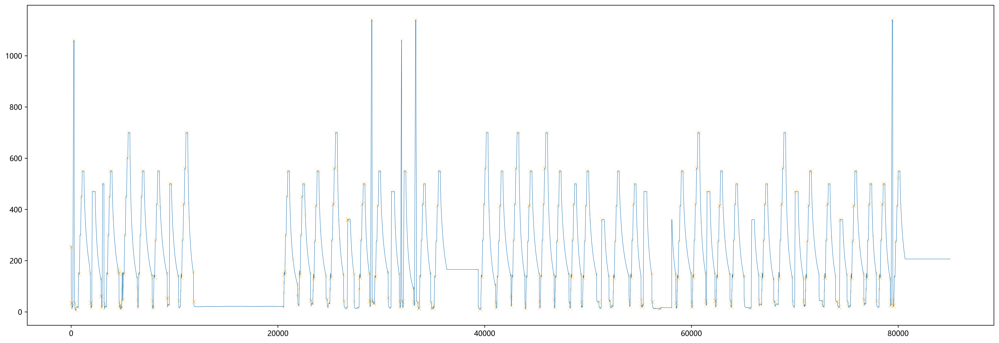

In [11]:
plt.figure(dpi=600, figsize=(24,8))
plt.plot(tmp_list, linewidth=0.5)
plt.scatter(x = turn_points, y= [ tmp_list[index] for index in turn_points], color="orange", marker='x', linewidths=0.1)

## 2.2 分段点筛选

### 2.2.1 使用极值趋势段的方法

#### 2.2.1.1 通过极值趋势段筛选初步筛选分段点

**极值趋势段：**
1. 趋势段：趋势段由两端的均值表征。仔细思考后发现这样的表征非常有意义，能很好的将两端转折点的值波动很好的控制在一个范围内。如下图
![均值表征趋势段的意义](https://s2.loli.net/2022/11/14/kXJGqYdjfr5KLlI.jpg)

2. 极值趋势段的定义： **前后相邻趋势段的表征均大于 / 小于 当前趋势段**
3. 极值趋势段的意义：将由转折点获得的每一个趋势段进行筛选

In [12]:
# 猜想1 实现
def get_segPoints(data, turnPoints, sigma):
    '''
    本函数用于通过极值趋势段的选取筛选对应的转折点，最后得到时间序列的分段点
    :param data: 原始时间序列数据
    :param turnPoints: 转折点序列, 记录的是转折点在原数据中对应的 index
    :param sigma: 选取极值趋势段的阈值

    :return segPoints: 分段点, 其对应的也是分段点在原数据中的索引
    '''
    segPoints = []
    # extremeSegs = []
    SegRepresents = []
    # 首先获取趋势段的表征
    for index in range(0, len(turn_points)-1):
        # 这里要注意，SegRepresents 的长度比 turnPoints 的长度小 1
        # 使用趋势段的前部点作为其标识
        SegRepresents.append(((data[turnPoints[index]] + data[turnPoints[index+1]])/2, index))

    # 然后搜寻极值趋势段，进行筛选
    for i in range(1, len(SegRepresents)-1):
        # 极大趋势段
        if ( SegRepresents[i][0] > SegRepresents[i-1][0] and SegRepresents[i][0] > SegRepresents[i+1][0] ) and \
                ( (SegRepresents[i][0] - SegRepresents[i-1][0]) > sigma or (SegRepresents[i][0] - SegRepresents[i+1][0]) > sigma ):
            if data[turn_points[SegRepresents[i][1]]] > data[turn_points[SegRepresents[i][1]+1]] :
                segPoints.append(turn_points[SegRepresents[i][1]])
            else:
                segPoints.append(turn_points[SegRepresents[i][1]+1])
        
        # 极小趋势段
        if ( SegRepresents[i][0] < SegRepresents[i-1][0] and SegRepresents[i][0] < SegRepresents[i+1][0] ) and \
                ( (SegRepresents[i][0] - SegRepresents[i-1][0]) > sigma or (SegRepresents[i][0] - SegRepresents[i+1][0]) > sigma ):
            if data[turn_points[SegRepresents[i][1]]] < data[turn_points[SegRepresents[i][1]+1]] :
                segPoints.append(turn_points[SegRepresents[i][1]])
            else:
                segPoints.append(turn_points[SegRepresents[i][1]+1])
    return segPoints

In [13]:
segPoints1 = get_segPoints(data=tmp_list, turnPoints=turn_points, sigma=0.05)

In [14]:
len(segPoints1)

119

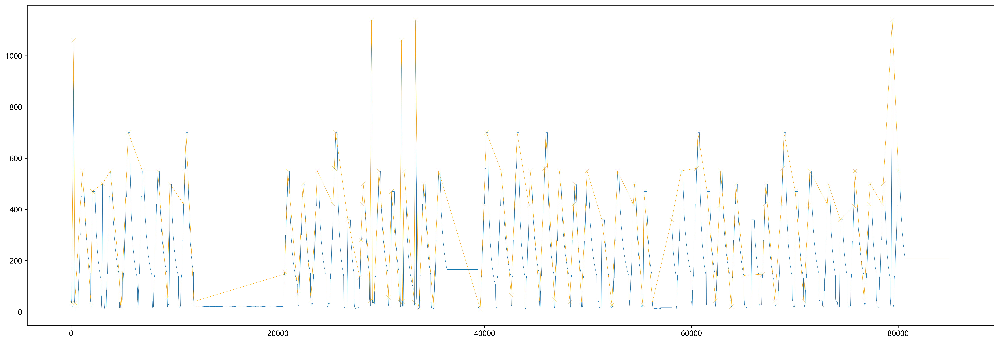

In [15]:
plt.figure(dpi=600, figsize=(24,8))
plt.plot(tmp_list, linewidth=0.3)
plt.scatter(x = segPoints1, y= [ tmp_list[index] for index in segPoints1], color="orange", marker='x', linewidths=0.1)
plt.plot(segPoints1, [ tmp_list[index] for index in segPoints1], color="orange", linewidth=0.3)

#### 2.2.1.2 进行插值

In [16]:
def interpolation(data, seg_s, seg_e):
    '''
    该方法用于时间序列分段后, 在每段内进行插值.
    此处的插值并不是模拟一个数据, 而是寻找分段点内需要补充的原始数据点的索引.
    :param data: 时间序列数据
    :param seg_s: 需要进行插值的分段的起点, 其值是分段点对应原数据中的索引
    :param seg_e: 需要进行插值的分段的终点, 其值是分段点对应原数据中的索引点

    :return iplt_position: 即插入的对应的索引
    '''
    k = (data[seg_s] - data[seg_e]) / ( seg_s - seg_e)
    distance_list = []
    
    for index in range(seg_s, seg_e):
        distance = abs((data[seg_s] + (k * (index - seg_s))) - data[index])
        distance_list.append(distance)

    iplt_position = distance_list.index(max(distance_list)) + seg_s
    # return iplt_position
    return seg_s, iplt_position, seg_e

In [17]:
# 测试
# 记住，这里一定要用 deepCopy，否则插值的时候，会在原分段数据上进行插值，
# 导致 segPoints1 中的数据一直增加，反复在局部进行重复插值
# segPoints1_iplt = segPoints1.copy() # 这样写是和下面之前的写法配套，但是会出问题

segPoints1_iplt = []

# 直接这样写，会导致在插入值得过程中，因为插入后索引的改变，而导致插值位置越来越偏离
# for index in range(0, iplt_end):
#     iplt_position = interpolation(tmp_list, seg_s=segPoints1[index], seg_e=segPoints1[index+1])
#     segPoints1_iplt.insert(index+1, iplt_position)

# 改为如下写法：
for index in range(0, len(segPoints1) - 1):
    seg_s, iplt_position, seg_e = interpolation(tmp_list, seg_s=segPoints1[index], seg_e=segPoints1[index+1])
    segPoints1_iplt.append(seg_s)
    segPoints1_iplt.append(iplt_position)
segPoints1_iplt.append(seg_e)

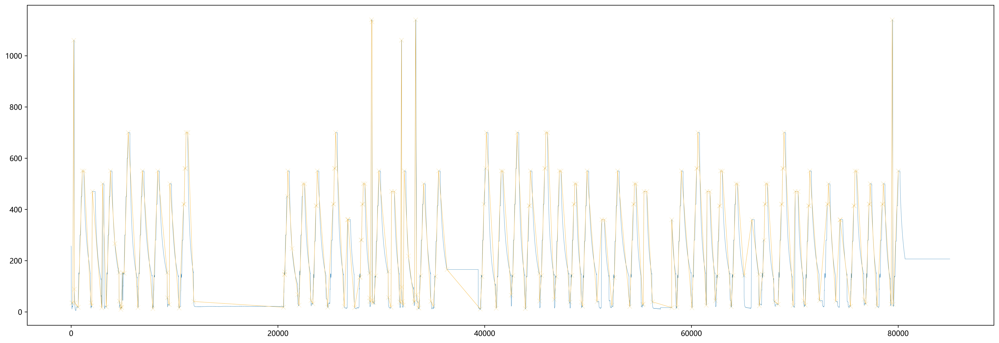

In [18]:
plt.figure(dpi=600, figsize=(24,8))
plt.plot(tmp_list, linewidth=0.3)
plt.scatter(x = segPoints1_iplt, y= [ tmp_list[index] for index in segPoints1_iplt], color="orange", marker='x', linewidths=0.1)
plt.plot(segPoints1_iplt, [ tmp_list[index] for index in segPoints1_iplt], color="orange", linewidth=0.3)

上述结果表明：使用极值趋势段进行筛选的效果并不是很好，得到的结果非常不理想。

### 2.2.2 使用 Bottom - Up 的方法进行分段线性表达

先定义误差函数

In [19]:
# 左闭右闭区间，[seq_range[0],seq_range[1]]   seq_range是个元组(s,e)
def calculate_error(data,seq_range):
    '''
    :param data: 温度数据
    :param seq_range: 范围值
    :return:
    '''
    start,end = seq_range[0],seq_range[1] + 1
    x = np.arange(start,end)
    y = np.array(data[start:end])
    A = np.ones((len(x),2),float)
    A[:,0] = x
    # 返回回归系数、残差平方和、自变量X的秩、X的奇异值
    (p,residuals,ranks,s) = LA.lstsq(A,y,rcond=None)
    try:
        error = residuals[0]
    except IndexError:
        error = 0.0
    error = math.sqrt(error)
    return error

定义 Bottom - Up 方法

In [20]:
def bottomUpMerge(T,break_points,merge_ths,calculate_error=calculate_error):
    '''
    :param T: 整个时间序列
    :param break_points: 转折点的列表
    :param merge_ths: 合并阈值
    :param calculate_error: 拟合误差
    :return:
    '''
    seg = []
    merge_cost = []
    s = 0
    # 对哦，我可以在需要的时候将每个分段进行打包，而非在传入的时候就以元组的形式表达分段
    # 左闭区间，右闭区间    将每个分段的起始位置以元组的形式存放到seg列表中
    for bp in break_points:
        seg.append((s,bp)) # s 表示 这一个分段的起点，bp 表示这一个分段的终点
        s = bp
    seg.append((s,len(T) - 1))

    #计算相邻段的误差       遍历整个seg列表，
    for i in range(0,len(seg) - 1):
        merge_cost.append(calculate_error(T,(seg[i][0],seg[i + 1][1])))

    # 寻找拟合误差最小的分段
    while min(merge_cost) < merge_ths:
        index = merge_cost.index(min(merge_cost))
        #合并当前和下一个区间，合并后将下一个分段区间删掉
        seg[index] = (seg[index][0],seg[index + 1][1])
        del seg[index + 1]

        # 更新前一个区间的拟合误差
        if index > 0:
            merge_cost[index - 1] = calculate_error(T, (seg[index - 1][0], seg[index][1]))

        # 更新下一个区间的拟合误差
        if index < len(seg) - 1:
            merge_cost[index] = calculate_error(T,(seg[index][0],seg[index + 1][1]))
            del merge_cost[index + 1]
        #没有下一个区间，遍历到拟合误差数组的最后一个，即删除最后一个
        else:
            del merge_cost[index]
    return seg

In [21]:
segPoints2 = bottomUpMerge(tmp_list, turn_points, merge_ths=50)
segPoints2 = [ seg[0] for seg in segPoints2]

In [37]:
segPoints2.__len__()

596

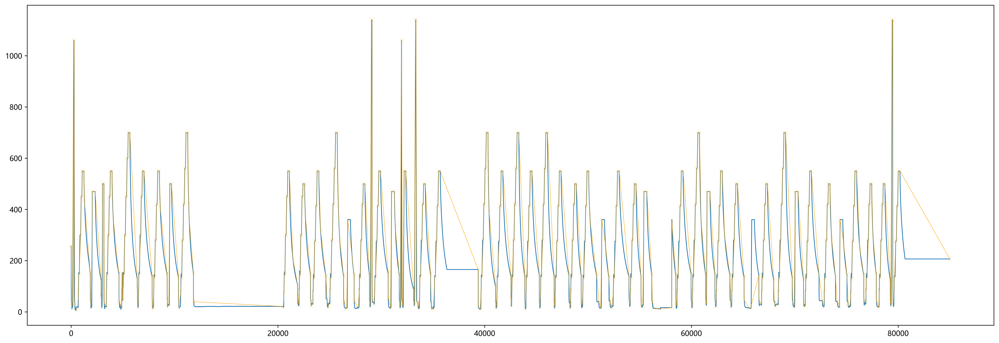

In [22]:
plt.figure(dpi=600, figsize=(24,8))
plt.plot(tmp_list, linewidth=1)
plt.scatter(x = segPoints2, y= [ tmp_list[index] for index in segPoints2], color="orange", marker='x', linewidths=0.1)
plt.plot(segPoints2, [ tmp_list[index] for index in segPoints2], color="orange", linewidth=0.5)

最终汇合，我觉得可以使用 bottom - up 进行第一步的拟合筛选，然后对融合后的各个段进行误差评估，如果大于设定的误差，则进行插值。  
这样，插值可以弥补两个缺点：
1. 过度融合的点
2. 转折点（turnPoints）寻找时没有找到的点可以在插值时找出

### 2.2.3 使用 Bottom-up + 插值 进行分段线性表达

需要的工作：
1. 衡量 bottom - up 融合过程中的误差：merge_cost()
2. bottom up 汇合 ： bottomUp()
3. 衡量是否需要插值：segError()
4. 插值算法：interpolation()

笔记：使用 least square 方法求解线性方程获取直线的方法

首先，一条直线的定义为 $y=ax+b$，此时我们将其抽象为线性方程的表达式：

$\vec{y} = [\vec{x}, \vec{1}] \times [a,b]^T$ 即 $[\vec{x}, \vec{1}] \times [a,b]^T = \vec{y}$

线性方程： $Az = c$，将其对应于直线方程的各个部分：  
1. $A$ 对应于 $[\vec{x}, \vec{1}]$
2. $z$ 对应于 $[a,b]^T$
3. $\vec{y}$ 对应于 $c$
（注意，此处的 $x$ 与 直线方程中的 $x$ 是无关的，不具有相同意义）

那么，当我们拥有直线方程中 $\vec{x}$ 和 $\vec{y}$ 两组对应的数据时，想要得到直线方程，其实就是求解 $Az=c$ 的解 $z$，即对应于直线中的系数 $[a,b]^T$

---

当然，least square 并不是只能解直线方程，通过转换，可以做多项式拟合的求解。同时，也可以通过数据，反解各种数值拟合过程中（例如上面的直线方程一样）

In [23]:
def merge_cost(data, merge_start, merge_end):
    ''' 
    本方法使用 least-squares solution to a linear matrix equation 方法进行直线拟合。
    同时获得拟合误差。
    调用 numpy.linalg.lstsq() 方法
    :param data: 时间序列数据
    :param merge_start: 合并起始点
    :param merge_end: 合并终点

    :return error: 合并产生的误差
    '''
    x = np.arange(merge_start, merge_end+1) # +1 的原因是 np.arange 为左闭右开
    y = np.array(data[merge_start:merge_end+1])
    A = np.ones((len(x), 2), np.float64)
    A[:,0] = x
    try:
        (result, residual, rank, s) = LA.lstsq(A, y, rcond=None)
        error = math.sqrt(residual[0])
    except np.linalg.LinAlgError:
        error = 0.0
    except IndexError:
        error = 0.0

    return error


In [32]:
def bottomUp(data, turn_points, error_thred, error_estimator=merge_cost):
    ''' 
    :param data: 时间序列数据
    :param turn_points: 转折点数据
    :param error_thred: 融合过程中的误差阈值, 超过阈值后, 融合停止
    :param error_estimator: 融合过程中的误差估计方法

    :return segments
    '''
    index = 0
    segments = [turn_points[0]] # 加入起始的开始点
    len_turnPoints = len(turn_points) - 1

    while index < len_turnPoints:
        start = index
        end = index + 1
        while error_estimator(data, turn_points[start], turn_points[end]) < error_thred:
            end += 1
            if not (end < len_turnPoints): break
        segments.append(turn_points[end])
        index = end
    
    return segments

In [33]:
test = bottomUp(tmp_list, turn_points=turn_points, error_thred=50)

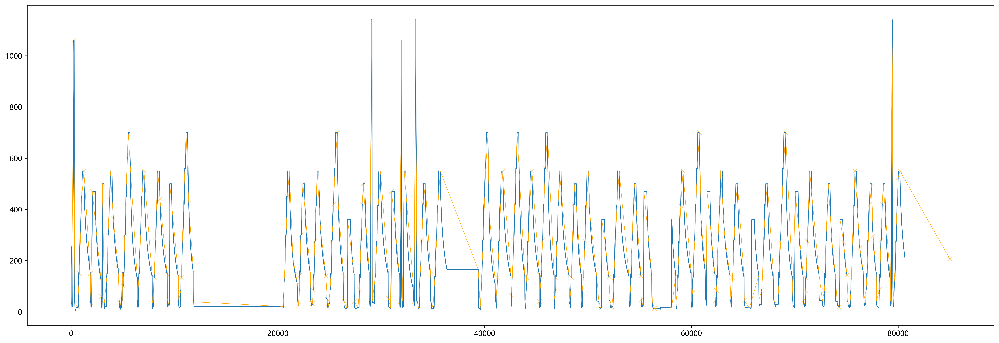

In [35]:
plt.figure(dpi=600, figsize=(24,8))
plt.plot(tmp_list, linewidth=1)
plt.scatter(x = test, y= [ tmp_list[index] for index in test], color="orange", marker='x', linewidths=0.1)
plt.plot(test, [ tmp_list[index] for index in test], color="orange", linewidth=0.5)

In [58]:
def segError(data, seg_s, seg_e):
    ''' 
    :param data: 时间序列数据
    :param seg_s: 分段开始
    :param seg_e: 分段结束

    :return seg_error: 该段的误差
    :return maxError_index: 该段最大误差所对应的索引
    '''
    k = (data[seg_s] - data[seg_e]) / ( seg_s - seg_e)
    distance_list = []
    
    for index in range(seg_s, seg_e):
        distance = abs((data[seg_s] + (k * (index - seg_s))) - data[index])
        distance_list.append(distance)

    seg_error = sum(distance_list) / (seg_e - seg_s)
    maxError_index = distance_list.index(max(distance_list))
    return seg_error, maxError_index

In [61]:
def seg_interpolation(data, segments, iplt_thred):
    ''' 
    :paras data: 时间序列数据
    :paras segments: 分段点
    :param iplt_thred: 插值阈值, 当某段误差大于该阈值, 就需要对其进行插值
    
    :return seg_iplt
    '''
    seg_iplt = []
    for index in range(0, len(segments)-1):
        seg_error, maxError_index = segError(data=data, seg_s=segments[index], seg_e=segments[index+1])
        if seg_error < iplt_thred:
            seg_iplt.append(segments[index])
        else:
            seg_iplt.append(segments[index])
            # maxError_index 对应是以 segments[index] 为起点开始计数得对应得最大误差的索引
            seg_iplt.append(segments[index] + maxError_index)
        
    seg_iplt.append(segments[-1]) # 将最后一点加进去
    return seg_iplt

In [62]:
test_iplt = seg_interpolation(data=tmp_list, segments=test, iplt_thred=80)

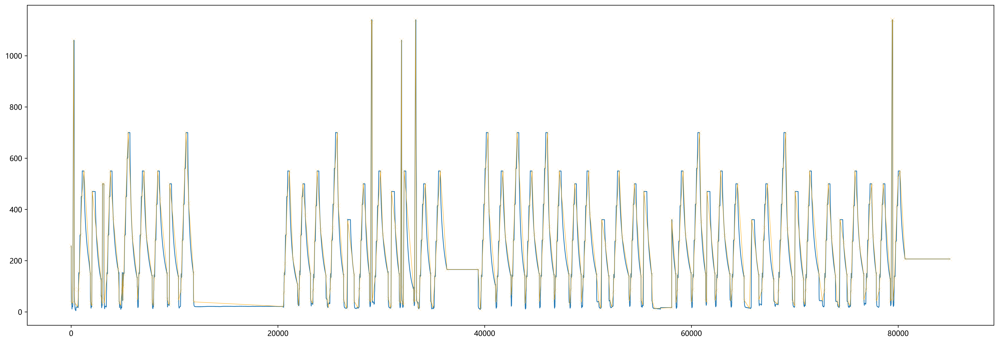

In [63]:
plt.figure(dpi=600, figsize=(24,8))
plt.plot(tmp_list, linewidth=1)
plt.scatter(x = test_iplt, y= [ tmp_list[index] for index in test_iplt], color="orange", marker='x', linewidths=0.1)
plt.plot(test_iplt, [ tmp_list[index] for index in test_iplt], color="orange", linewidth=0.5)

In [64]:
test_iplt.__len__()

371

In [55]:
test.__len__()

340

关于 bottom up 的总结：
bottom up 的关键点：
1. 误差阈值：在融合的过程中，用于决定此次融合是否能够进行
2. 误差衡量：融合的过程中，衡量此次融合会造成多大的误差
3. 融合：从起点开始，不断向前汇集，删去中间点，直到分段的误差大于误差阈值。此时就以该分段的结尾作为下一个分段的起点进行下一次融合。
  
bottom up 而言，有复杂度较低的优点，只需要一次遍历就能完成融合。即 $O(n)$ 的时间复杂度。  
但其缺点是其融合效果依赖于转折点寻找的过程，即其只能对现有转折点进行 merge，但如果转折点寻找过程中没有找到的点，在 bottom up 的过程中是无法找到的。


完美！